## Finetune Maskformer for Flood Area Segmentation
Dataset: [Flood Area Segmentation on Kaggle](https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation/data)

[Reference notebook on Finetuning of Maskformer](https://github.com/NielsRogge/Transformers-Tutorials/blob/master/MaskFormer/Fine-tuning/Fine_tuning_MaskFormerForInstanceSegmentation_on_semantic_sidewalk.ipynb)

BibTeX entry:
```bibtex
@software{Rogge_Transformers_Tutorials_2020,
author = {Rogge, Niels},
doi = {10.5281/zenodo.1234},
month = sep,
title = {{Transformers Tutorials"}},
url = {https://github.com/NielsRogge/Transformers-Tutorials},
version = {1.0},
year = {2020}
}
```

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image
from tqdm.auto import tqdm
from datasets import Dataset, DatasetDict, Image as HFDatasetImage
import torch
from torch.utils.data import Dataset as TorchDataset
from torch.utils.data import DataLoader
import albumentations as A
np.random.seed(42)
%matplotlib inline

### Load data

#### Read files

In [2]:
# Path to the director where images for semantic segmentation are stored
IMAGES_DIR = 'data/Image/'
# Path to the directory where labels for semantic segmentation are stored
LABELS_DIR = 'data/Mask/'
IMG_EXT = 'jpg'
LABEL_EXT = 'png'

In [3]:
metadata = pd.read_csv('data/metadata.csv')
metadata.head()

,Image,Mask
0,0.jpg,0.png
1,1.jpg,1.png
2,2.jpg,2.png
3,3.jpg,3.png
4,4.jpg,4.png


In [4]:
def get_all_images_labels(IMAGES_DIR, LABELS_DIR, metadata):
    """
    Return the list of all valid images and labels
    """
    images = []
    labels = []
    min_h = 1e6; max_h = 0
    min_w = 1e6; max_w = 0
    for _, row in metadata.iterrows():
        image = os.path.join(IMAGES_DIR, row['Image'])
        label = os.path.join(LABELS_DIR, row['Mask'])
        img_arr = np.array(Image.open(image))
        label_arr = np.array(Image.open(label))
        if (img_arr.ndim == 3) and (img_arr.shape[2] == 3) and (img_arr.shape[:-1] == label_arr.shape):
            min_h = min(min_h, img_arr.shape[0]); max_h = max(max_h, img_arr.shape[0])
            min_w = min(min_w, img_arr.shape[1]); max_w = max(max_w, img_arr.shape[1])
            images.append(image)
            labels.append(label)
        else:
            print(f"Skipping image {row['Image']} and mask {row['Mask']}")
    print(f"Min height: {min_h}, Max height: {max_h}")
    print(f"Min width: {min_w}, Max width: {max_w}")
    return images, labels

In [5]:
# Take the first TRAIN_SIZE images for training
all_images, all_labels = get_all_images_labels(IMAGES_DIR, LABELS_DIR, metadata)

print(len(all_images), len(all_labels))
print(all_images[:5])
print(all_labels[:5])

Skipping image 0.jpg and mask 0.png
Skipping image 2.jpg and mask 2.png
Skipping image 14.jpg and mask 14.png
Skipping image 15.jpg and mask 15.png
Skipping image 2052.jpg and mask 2052.png
Skipping image 2053.jpg and mask 2053.png
Skipping image 3048.jpg and mask 3048.png
Skipping image 3059.jpg and mask 3059.png
Skipping image 1061.jpg and mask 1061.png
Skipping image 1079.jpg and mask 1079.png
Min height: 219, Max height: 3648
Min width: 330, Max width: 5472
280 280
['data/Image/1.jpg', 'data/Image/3.jpg', 'data/Image/4.jpg', 'data/Image/5.jpg', 'data/Image/6.jpg']
['data/Mask/1.png', 'data/Mask/3.png', 'data/Mask/4.png', 'data/Mask/5.png', 'data/Mask/6.png']


In [6]:
TRAIN_SIZE = 200 # Number of images to use for training
VAL_SIZE = 20 # Number of images to use for validation
TEST_SIZE = 60 # Number of images to use for testing

In [7]:
image_paths_train = all_images[:TRAIN_SIZE]
label_paths_train = all_labels[:TRAIN_SIZE]

print(image_paths_train[:5])
print(label_paths_train[:5])

image_paths_val = all_images[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]
label_paths_val = all_labels[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]

print(image_paths_val[:5])
print(label_paths_val[:5])

image_paths_test = all_images[-TEST_SIZE:]
label_paths_test = all_labels[-TEST_SIZE:]

print(image_paths_test[:5])
print(label_paths_test[:5])

['data/Image/1.jpg', 'data/Image/3.jpg', 'data/Image/4.jpg', 'data/Image/5.jpg', 'data/Image/6.jpg']
['data/Mask/1.png', 'data/Mask/3.png', 'data/Mask/4.png', 'data/Mask/5.png', 'data/Mask/6.png']
['data/Image/1006.jpg', 'data/Image/1007.jpg', 'data/Image/1008.jpg', 'data/Image/1009.jpg', 'data/Image/1010.jpg']
['data/Mask/1006.png', 'data/Mask/1007.png', 'data/Mask/1008.png', 'data/Mask/1009.png', 'data/Mask/1010.png']
['data/Image/1026.jpg', 'data/Image/1027.jpg', 'data/Image/1028.jpg', 'data/Image/1029.jpg', 'data/Image/1030.jpg']
['data/Mask/1026.png', 'data/Mask/1027.png', 'data/Mask/1028.png', 'data/Mask/1029.png', 'data/Mask/1030.png']


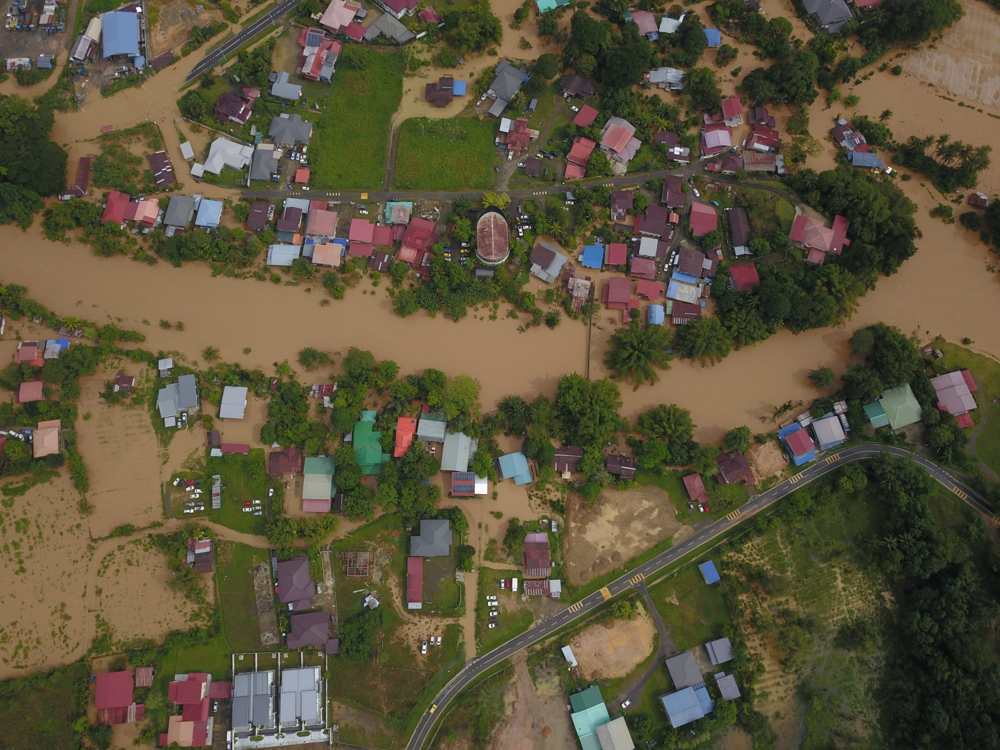

In [8]:
Image.open(image_paths_train[5])

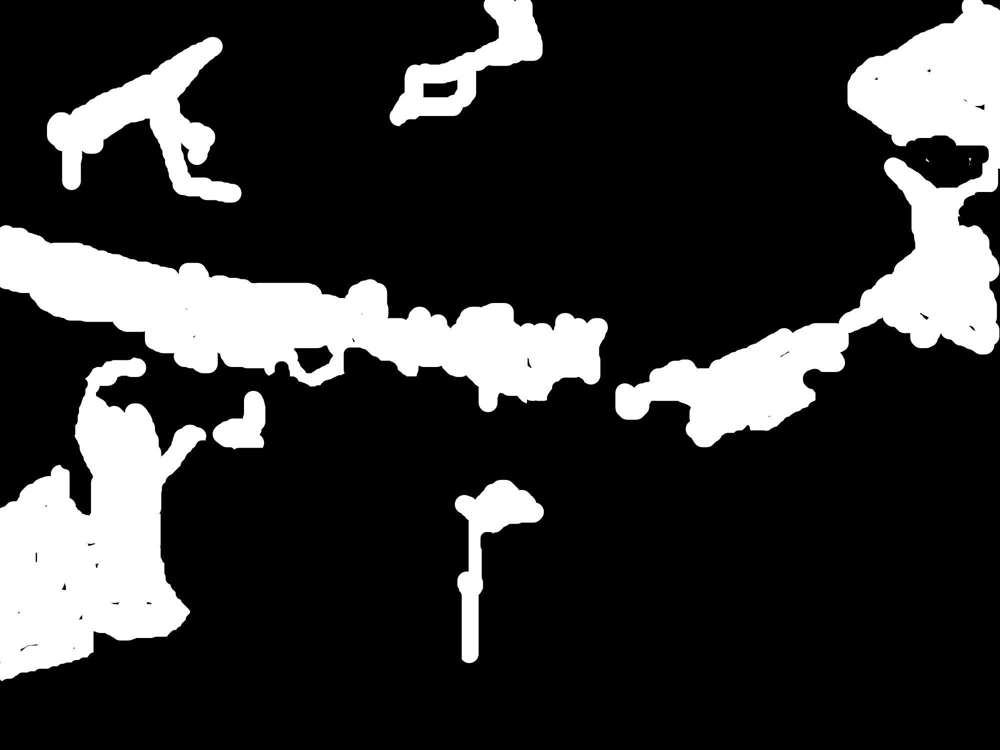

In [9]:
Image.open(label_paths_train[5])

**Note:** White color in mask means flooded area and black color means non-flooded area.

#### Convert into Hugging Face Dataset format

In [10]:
def convert_to_binary_mask(label_path, threshold=128):
    """
    Convert a label image to a binary mask using a threshold
    """
    # Load the label image as a numpy array
    label_image = np.array(Image.open(label_path))
    
    # Apply thresholding to create a binary mask (values >= threshold will be 2, others 1)
    binary_mask = (label_image >= threshold).astype(np.uint8)
    
    return binary_mask

def create_dataset(image_paths, label_paths, threshold=128):
    # Create Dataset from image paths and label paths
    dataset = Dataset.from_dict({"image": image_paths,
                                 "label": [convert_to_binary_mask(label_path, threshold) for label_path in label_paths]})
    
    # Cast the "image" column to use the HFDatasetImage class to handle image loading
    dataset = dataset.cast_column("image", HFDatasetImage())

    # dataset = dataset.cast_column("label", HFDatasetImage())
    
    return dataset

train_dataset = create_dataset(image_paths_train, label_paths_train)
val_dataset = create_dataset(image_paths_val, label_paths_val)
test_dataset = create_dataset(image_paths_test, label_paths_test)

In [11]:
dataset = DatasetDict({
    "train": train_dataset,
    "val": val_dataset,
    "test": test_dataset
  }
)

In [12]:
train_ds = dataset["train"]
val_ds = dataset["val"]
test_ds = dataset["test"]

##### Plot a sample

(1500, 2000, 3)


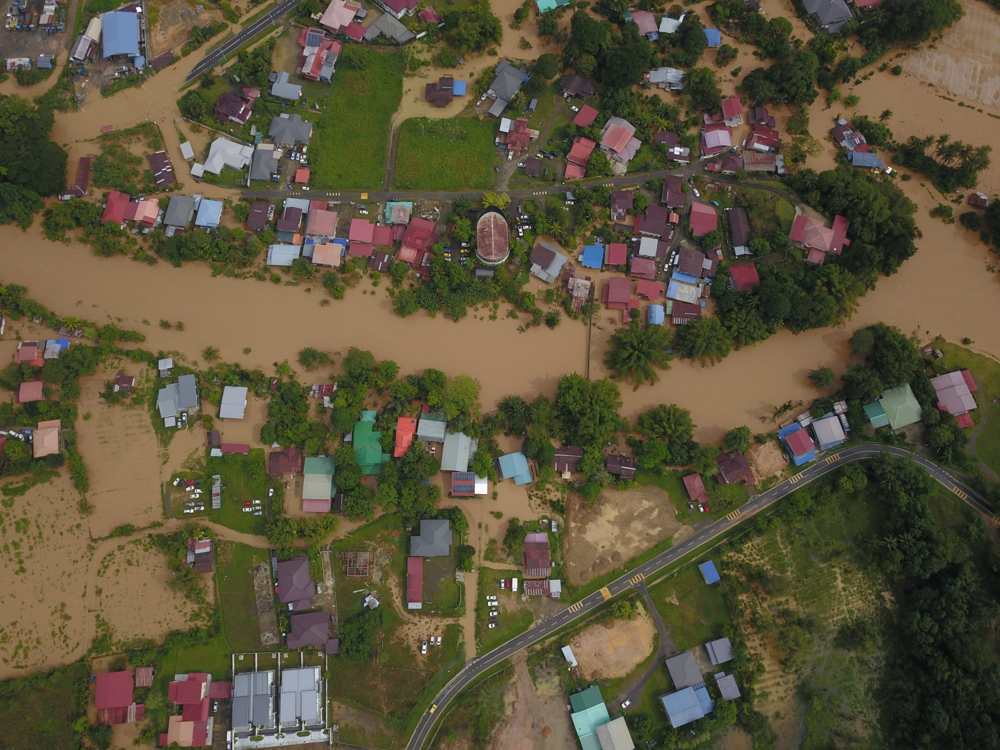

In [13]:
idx = 5
example = dataset["train"][idx]
image = example["image"]
print(np.array(image).shape)
image

In [14]:
# load corresponding ground truth segmentation map, which includes a label per pixel
segmentation_map = np.array(example['label'])
segmentation_map, segmentation_map.shape

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 (1500, 2000))

In [15]:
np.unique(segmentation_map)

array([0, 1])

In [16]:
# Define the mapping from pixel values to class labels
id2label = {0: 'other', 1: 'flood'}

In [17]:
# Assign green color to non-flood and red color to flood
palette = np.array([[0, 255, 0], [0, 0, 255]])

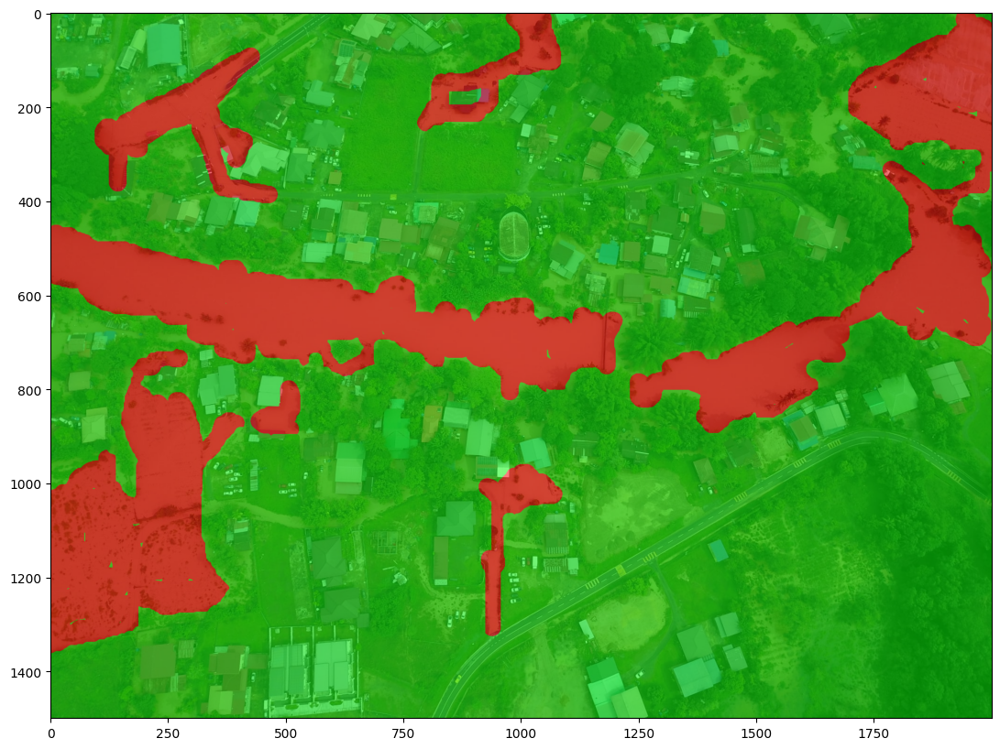

In [18]:
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

#### Create PyTorch Dataset

In [19]:
class ImageSegmentationDataset(TorchDataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.transform = transform
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        original_image = np.array(self.dataset[idx]['image'])
        original_segmentation_map = np.array(self.dataset[idx]['label'])
        
        transformed = self.transform(image=original_image, mask=original_segmentation_map)
        image, segmentation_map = transformed['image'], transformed['mask']

        # convert to C, H, W
        image = image.transpose(2,0,1)

        return image, segmentation_map, original_image, original_segmentation_map

In [20]:
def compute_stats(dataset):
    """
    Calculate mean and standard deviation of each channel of the images in the dataset
    """
    mean = []
    std = []
    for i in tqdm(range(len(dataset))):
        image = np.array(dataset[i]['image'])
        mean.append([float(image[:, :, i].mean()) for i in range(image.shape[2])])
        std.append([float(image[:, :, i].std()) for i in range(image.shape[2])])
        
    mean = np.array(mean).mean(axis=0)
    std = np.array(std).mean(axis=0)
    return mean, std

mean, std = compute_stats(train_ds)
mean, std

  0%|          | 0/200 [00:00<?, ?it/s]

(array([127.61284707, 126.67704506, 114.08192164]),
 array([55.01579928, 49.45631369, 53.15144932]))

Apply transformations to the dataset.

In [21]:
FLOOD_MEAN = mean / 255
FLOOD_STD = std / 255

H = 512
W = 512

train_transform = A.Compose([
    # A.LongestMaxSize(max_size=5000),
    A.Resize(width=768, height=768),
    A.RandomCrop(width=W, height=H),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=tuple(FLOOD_MEAN), std=tuple(FLOOD_STD)),
])

test_transform = A.Compose([
    A.Resize(width=W, height=H),
    A.Normalize(mean=tuple(FLOOD_MEAN), std=tuple(FLOOD_STD)),
])

train_dataset = ImageSegmentationDataset(train_ds, transform=train_transform)
val_dataset = ImageSegmentationDataset(val_ds, transform=test_transform)
test_dataset = ImageSegmentationDataset(test_ds, transform=test_transform)

#### Verify the transformations by unrolling them

In [22]:
image, segmentation_map, _, _ = train_dataset[5]
print(image.shape)
print(segmentation_map.shape)

(3, 512, 512)
(512, 512)


In [23]:
image.min(), image.max(), segmentation_map.min(), segmentation_map.max()

(np.float32(-2.3794138), np.float32(2.6512556), np.int32(0), np.int32(1))

Check that data augmentations work well

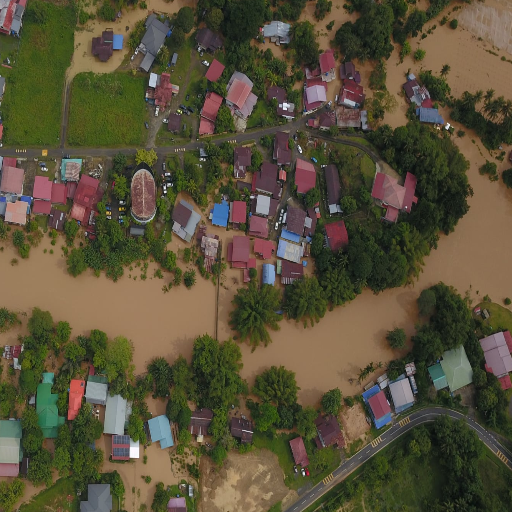

In [24]:
unnormalized_image = (image * np.array(FLOOD_STD)[:, None, None]) + np.array(FLOOD_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

Check that map is correct

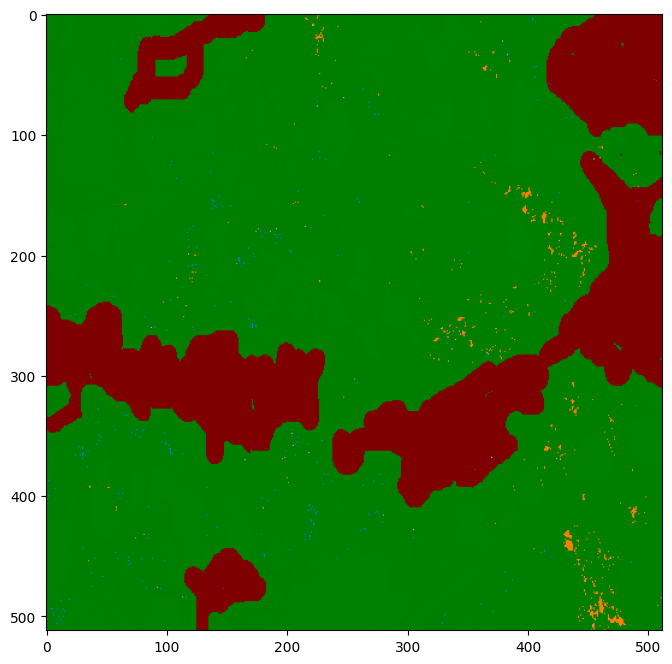

In [25]:
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.moveaxis(image, 0, -1) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.show()

#### Create PyTorch DataLoaders

In [26]:
from transformers import MaskFormerImageProcessor

# Create a preprocessor
# preprocessor = MaskFormerImageProcessor(ignore_index=0, reduce_labels=False,
#                                         do_resize=False, do_rescale=False, do_normalize=False)
preprocessor = MaskFormerImageProcessor(ignore_index=-1,reduce_labels=False, do_resize=False,
                                        do_rescale=False, do_normalize=False, num_labels=2)

In [27]:
BATCH_SIZE = 4

In [28]:
def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    # this function pads the inputs to the same size,
    # and creates a pixel mask
    # actually padding isn't required here since we are cropping
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )

    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]
    
    return batch

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

#### Final verification of data

In [29]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,v[0].shape)

pixel_values torch.Size([4, 3, 512, 512])
pixel_mask torch.Size([4, 512, 512])
mask_labels torch.Size([2, 512, 512])
class_labels torch.Size([2])
original_images (715, 936, 3)
original_segmentation_maps (715, 936)


In [30]:
pixel_values = batch["pixel_values"][0].numpy()
pixel_values.shape

(3, 512, 512)

Again, let's denormalize an image

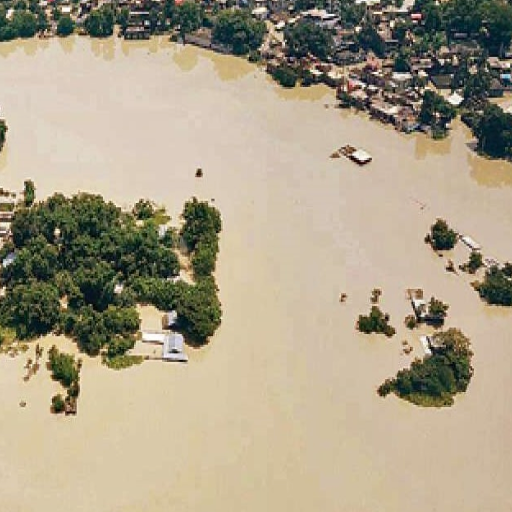

In [31]:
unnormalized_image = (pixel_values * np.array(FLOOD_STD)[:, None, None]) + np.array(FLOOD_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

Let's verify the corresponding binary masks + class labels

In [32]:
batch["class_labels"][0].tolist()

[0, 1]

In [33]:
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['other', 'flood']


In [34]:
def visualize_mask(labels, label_name):
  """
  Visualize the mask for a specific label
  """
  print("Label:", label_name)
  idx = labels.index(label_name)

  visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
  return Image.fromarray(visual_mask)

Label: flood


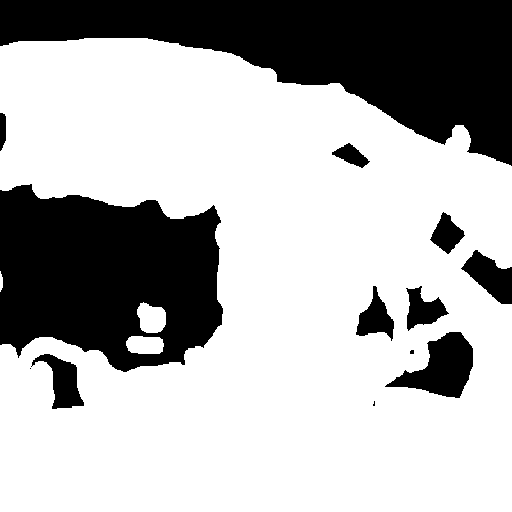

In [35]:
visualize_mask(labels, "flood")

### Define Model
Ignore mismatches keys to replace the already fine-tuned classification head

In [36]:
from transformers import MaskFormerForInstanceSegmentation

# Replace the head of the pre-trained model
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-ade",
                                                          id2label=id2label,
                                                          ignore_mismatched_sizes=True)

# Load the model on the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("Done loading model")

Some weights of MaskFormerForInstanceSegmentation were not initialized from the model checkpoint at facebook/maskformer-swin-base-ade and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([151, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([151]) in the checkpoint and torch.Size([3]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([151]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Done loading model


**Note:** Evaluation metric used is Mean Intersection over Union (mIoU) from `evaluate` library.

In [37]:
import evaluate

metric = evaluate.load("mean_iou")

In [38]:
def evaluate_iou(model, dataloader, metric: evaluate.EvaluationModule):
  model.eval()
  for _, batch in enumerate(tqdm(dataloader)):

    pixel_values = batch["pixel_values"]
    
    # Forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values.to(device))

    # NOTE: Original images are used to evaluate the model
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    # print("Prediction:")
    # print(predicted_segmentation_maps)
    # print("Ground Truth:")
    # print(ground_truth_segmentation_maps)

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)
  
  mean_iou = metric.compute(num_labels = len(id2label), ignore_index = -1)
  # NOTE this metric outputs a dict that also includes the mIoU per category as keys
  print("Mean IoU:", mean_iou['mean_iou'])
  return mean_iou

#### Evaluate the pre-trained model

In [39]:
evaluate_iou(model, val_dataloader, metric)

  0%|          | 0/5 [00:00<?, ?it/s]

/export/home/co21btech11001/.conda/envs/nlp_env/lib/python3.10/site-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")


Mean IoU: 0.23278936836502498


{'mean_iou': np.float64(0.23278936836502498),
 'mean_accuracy': np.float64(0.49549323919309907),
 'overall_accuracy': np.float64(0.4655684328962336),
 'per_category_iou': array([4.65564313e-01, 1.44235325e-05]),
 'per_category_accuracy': array([9.90971939e-01, 1.45389159e-05])}

**65.3%** mIoU on the validation set

#### Fine-tune the model on the flood area segmentation dataset

In [40]:
NUM_EPOCHS = 8

In [41]:
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(NUM_EPOCHS):
  print("Epoch:", epoch + 1)
  model.train()
  for idx, batch in enumerate(tqdm(train_dataloader)):
      # Reset the parameter gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
      )

      # Backward propagation
      loss = outputs.loss
      loss.backward()

      batch_size = batch["pixel_values"].size(0)
      running_loss += loss.item()
      num_samples += batch_size

      if idx % 10 == 0:
        print("Loss:", running_loss/num_samples)

      # Optimization
      optimizer.step()

  # Evaluate the model
  evaluate_iou(model, val_dataloader, metric)

Epoch: 1


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.7585709095001221
Loss: 0.47690379890528595
Loss: 0.3947652748652867
Loss: 0.35908379189429745
Loss: 0.3355160588171424


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8478474685358985
Epoch: 2


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.313527881806972
Loss: 0.29711236328375146
Loss: 0.28689997338912854
Loss: 0.2754834297078627
Loss: 0.26300857609117423


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8706837245895891
Epoch: 3


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.25499619617320524
Loss: 0.24735527626565984
Loss: 0.24160592719789378
Loss: 0.23532645381588974
Loss: 0.22936696073053575


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8878148706284303
Epoch: 4


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.22477112296006538
Loss: 0.2209261727999456
Loss: 0.2185169615679317
Loss: 0.21552181301525283
Loss: 0.21174529815063425


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8875921841010305
Epoch: 5


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.20976085953451507
Loss: 0.20707829635572658
Loss: 0.2063329621677485
Loss: 0.2041536881165071
Loss: 0.2008166531742361


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8875617195011022
Epoch: 6


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.1976724282738222
Loss: 0.19563028604591487
Loss: 0.19340794809794953
Loss: 0.19185015650671572
Loss: 0.18993423473333165


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8891080242610276
Epoch: 7


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.18839987131002733
Loss: 0.1868587425547589
Loss: 0.1850409250694829
Loss: 0.18320551684570816
Loss: 0.18193422245883173


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8808191507390801
Epoch: 8


  0%|          | 0/50 [00:00<?, ?it/s]

Loss: 0.1805629808232825
Loss: 0.17968633703866824
Loss: 0.17851330260583012
Loss: 0.1773418205010453
Loss: 0.17649547068778512


  0%|          | 0/5 [00:00<?, ?it/s]

Mean IoU: 0.8890939016588301


#### Save the model

In [42]:
# Save the model
model.save_pretrained("maskformer-flood_finetuned")

#### Inference on test dataset

In [43]:
batch = next(iter(test_dataloader))
# batch = next(iter(val_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([4, 3, 512, 512])
pixel_mask torch.Size([4, 512, 512])
mask_labels 4
class_labels 4
original_images 4
original_segmentation_maps 4


In [44]:
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))
  
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
ground_truth_segmentation_maps = batch["original_segmentation_maps"]

In [45]:
def draw_true_predicted_segmentation(image, predicted_segmentation_map, ground_truth_segmentation_map):
    # Use a subplot
    fig, ax = plt.subplots(1, 3, figsize=(15, 8))
    ax[0].imshow(image)
    ax[0].set_title("Image")
    ax[0].axis("off")

    # Draw the predicted segmentation map on the image
    pred_color_seg_map = np.zeros((predicted_segmentation_map.shape[0], predicted_segmentation_map.shape[1], 3), dtype=np.uint8)
    predicted_segmentation_map_cpu = predicted_segmentation_map.cpu().numpy()
    for label, color in enumerate(palette):
        pred_color_seg_map[predicted_segmentation_map_cpu == label, :] = color
    pred_color_seg = pred_color_seg_map[..., ::-1]
    pred = image * 0.5 + pred_color_seg * 0.5
    pred = pred.astype(np.uint8)
    ax[1].imshow(pred)
    ax[1].set_title("Predicted Segmentation")
    ax[1].axis("off")

    # Draw the ground truth segmentation map on the image
    gt_color_seg_map = np.zeros((ground_truth_segmentation_map.shape[0], ground_truth_segmentation_map.shape[1], 3), dtype=np.uint8)
    for label, color in enumerate(palette):
        gt_color_seg_map[ground_truth_segmentation_map == label, :] = color
    gt_color_seg = gt_color_seg_map[..., ::-1]
    gt = image * 0.5 + gt_color_seg * 0.5
    gt = gt.astype(np.uint8)
    ax[2].imshow(gt)
    ax[2].set_title("Ground Truth Segmentation")
    ax[2].axis("off")

    plt.show()

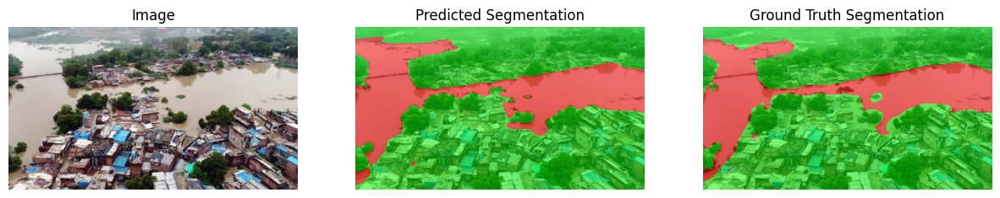

In [54]:
idx = 0
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

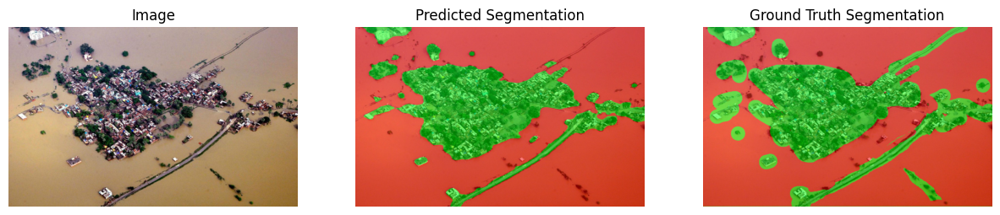

In [55]:
idx = 3
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

In [47]:
print("Prediction:")
predicted_segmentation_map = predicted_segmentation_maps[idx].cpu().numpy()
# Count the number of 1s in the predicted segmentation map
value, counts = np.unique(predicted_segmentation_map, return_counts=True)
for v, c in zip(value, counts):
    print(f"Label {v}: {c} pixels")
print(predicted_segmentation_map[:8, :8])
print("Ground Truth:")
print(ground_truth_segmentation_maps[idx][:8, :8])

Prediction:
Label 0: 408193 pixels
Label 1: 156807 pixels
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]
Ground Truth:
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]


In [48]:
sh = predicted_segmentation_map.shape
np.sum(predicted_segmentation_map == ground_truth_segmentation_maps[idx]) / (sh[0]*sh[1])

np.float64(0.9575911504424779)

Evaluate on test dataset

In [49]:
evaluate_iou(model, test_dataloader, metric)

  0%|          | 0/15 [00:00<?, ?it/s]

Mean IoU: 0.8642211241031499


{'mean_iou': np.float64(0.8642211241031499),
 'mean_accuracy': np.float64(0.9283633814985801),
 'overall_accuracy': np.float64(0.9340010424709018),
 'per_category_iou': array([0.9045077 , 0.82393455]),
 'per_category_accuracy': array([0.94588109, 0.91084568])}

### Conclusion
- Pre-trained model:
    - mIoU: **65.3%** on validation set
- Fine-tuned model:
    - mIoU: **88.9%** on validation set
    - mIoU: **86.4%** on test set